In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
from wordcloud import WordCloud
import nltk
import re
import matplotlib.pyplot as plt
import plotly.express as px
from nltk.corpus import stopwords
from nltk.stem.porter import PorterStemmer
from sklearn.feature_extraction.text import TfidfTransformer,CountVectorizer
from sklearn.naive_bayes import MultinomialNB
from sklearn import svm


In [3]:
data=pd.read_csv("UpdatedResumeDataSet.csv")
data.head()

,Category,Resume
0,Data Science,Skills * Programming Languages: Python (pandas...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...
2,Data Science,"Areas of Interest Deep Learning, Control Syste..."
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab..."


In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 962 entries, 0 to 961
Data columns (total 2 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   Category  962 non-null    object
 1   Resume    962 non-null    object
dtypes: object(2)
memory usage: 15.2+ KB


In [5]:
data.isnull().sum()

Category    0
Resume      0
dtype: int64

In [6]:
data.describe()

,Category,Resume
count,962,962
unique,25,166
top,Java Developer,"Technical Skills Web Technologies: Angular JS,..."
freq,84,18


In [7]:
fig=px.pie(data,names='Category',title='every category of resume')
fig.show()

[]

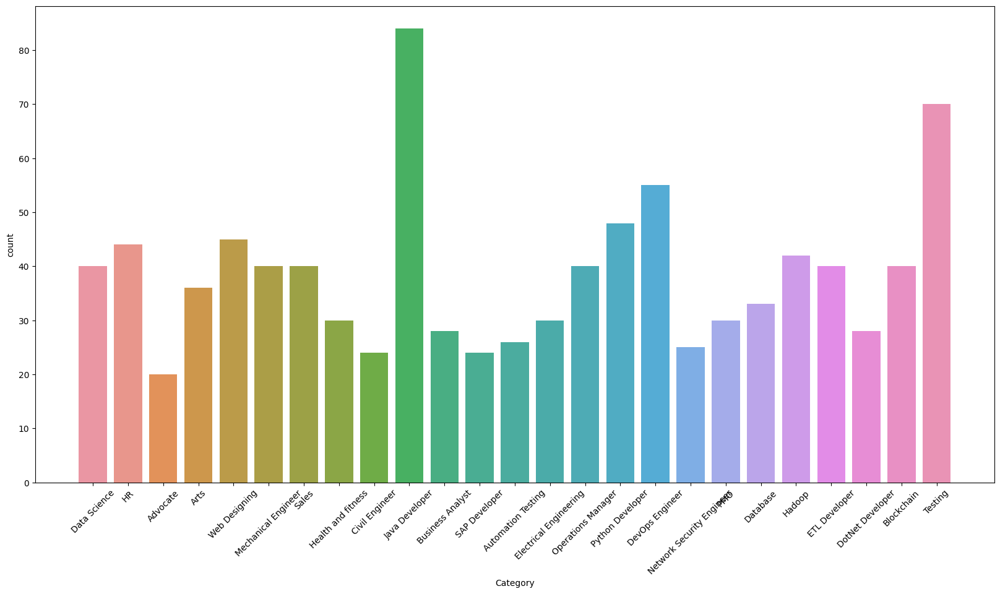

In [8]:
fig, axes =plt.subplots(1,1,figsize=(20,10))
ax=axes
plt.xticks(rotation=45)
ax=sns.countplot(data, x='Category')
ax.plot()


In [9]:
from sklearn.preprocessing import LabelEncoder
en=LabelEncoder()
data['Category_encode']=en.fit_transform(data['Category'])

In [10]:
data.head()

,Category,Resume,Category_encode
0,Data Science,Skills * Programming Languages: Python (pandas...,6
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,6
2,Data Science,"Areas of Interest Deep Learning, Control Syste...",6
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,6
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",6


In [11]:
category_mapping = dict(zip(data['Category_encode'], data['Category']))
category_mapping

{6: 'Data Science',
 12: 'HR',
 0: 'Advocate',
 1: 'Arts',
 24: 'Web Designing',
 16: 'Mechanical Engineer',
 22: 'Sales',
 14: 'Health and fitness',
 5: 'Civil Engineer',
 15: 'Java Developer',
 4: 'Business Analyst',
 21: 'SAP Developer',
 2: 'Automation Testing',
 11: 'Electrical Engineering',
 18: 'Operations Manager',
 20: 'Python Developer',
 8: 'DevOps Engineer',
 17: 'Network Security Engineer',
 19: 'PMO',
 7: 'Database',
 13: 'Hadoop',
 10: 'ETL Developer',
 9: 'DotNet Developer',
 3: 'Blockchain',
 23: 'Testing'}

In [12]:
all_stopwords=stopwords.words('english')
ps=PorterStemmer()

In [13]:
def make_fun(df):
  k=df.size
  print(k)
  corpus=[]
  for i in range(0,k):
     review=re.sub('[^a-zA-Z]',' ',df[i])
     review=review.lower()
     review=review.split()
     review=[ps.stem(word)for word in review if not word in set(all_stopwords)]
     review=' '.join(review)
     corpus.append(review)
  return corpus

In [14]:
data["encode_resume"]=make_fun(data['Resume'])

962


In [15]:
data.head()

,Category,Resume,Category_encode,encode_resume
0,Data Science,Skills * Programming Languages: Python (pandas...,6,skill program languag python panda numpi scipi...
1,Data Science,Education Details \r\nMay 2013 to May 2017 B.E...,6,educ detail may may b e uit rgpv data scientis...
2,Data Science,"Areas of Interest Deep Learning, Control Syste...",6,area interest deep learn control system design...
3,Data Science,Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...,6,skill r python sap hana tableau sap hana sql s...
4,Data Science,"Education Details \r\n MCA YMCAUST, Faridab...",6,educ detail mca ymcaust faridabad haryana data...


In [16]:
wordcloud_data=[]
for i in range(25):
    k=" ".join([str(text)for text in data['encode_resume'][data["Category_encode"]==i]])
    wordcloud_data.append(k)

In [17]:
def wordcloud_fun(data, title = None):
    wordcloud = WordCloud(
        background_color='white',
        max_words=250,
        max_font_size=30,
        scale=2,
        random_state=5 
).generate((data))

    fig = plt.figure(1, figsize=(15, 15))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize=20)
        fig.subplots_adjust(top=2.3)
    plt.imshow(wordcloud)
    plt.show()

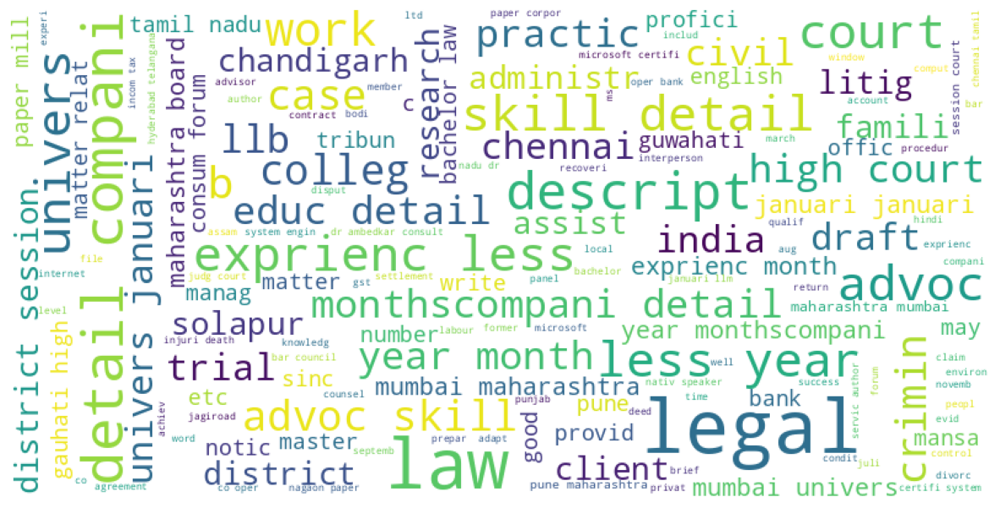

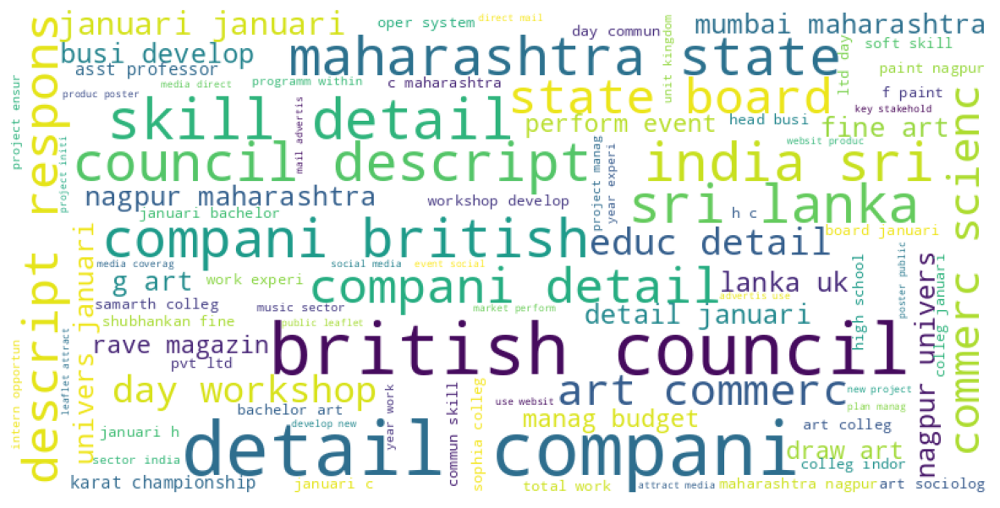

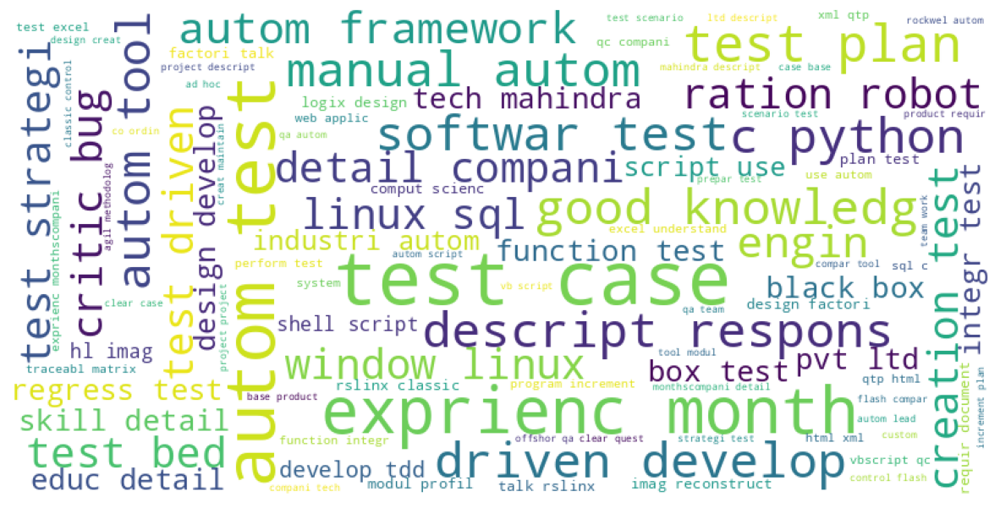

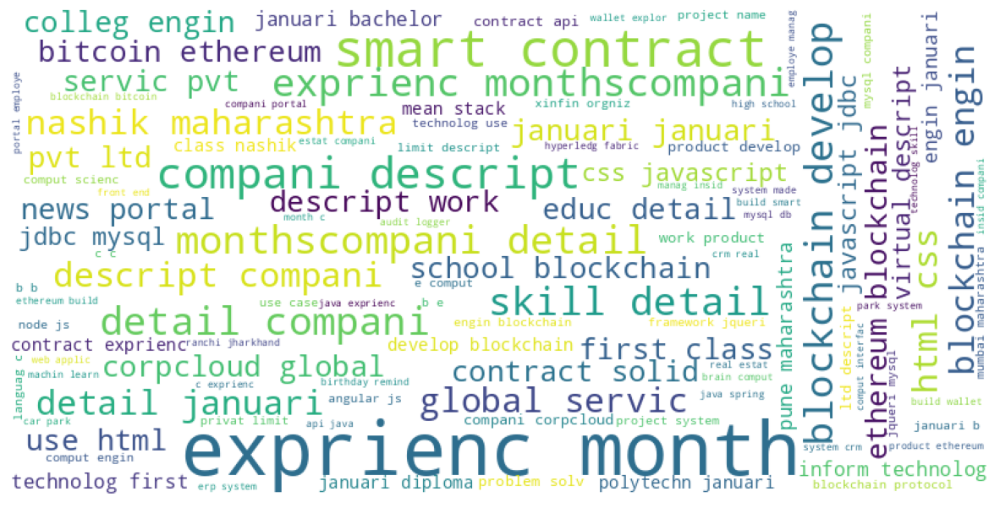

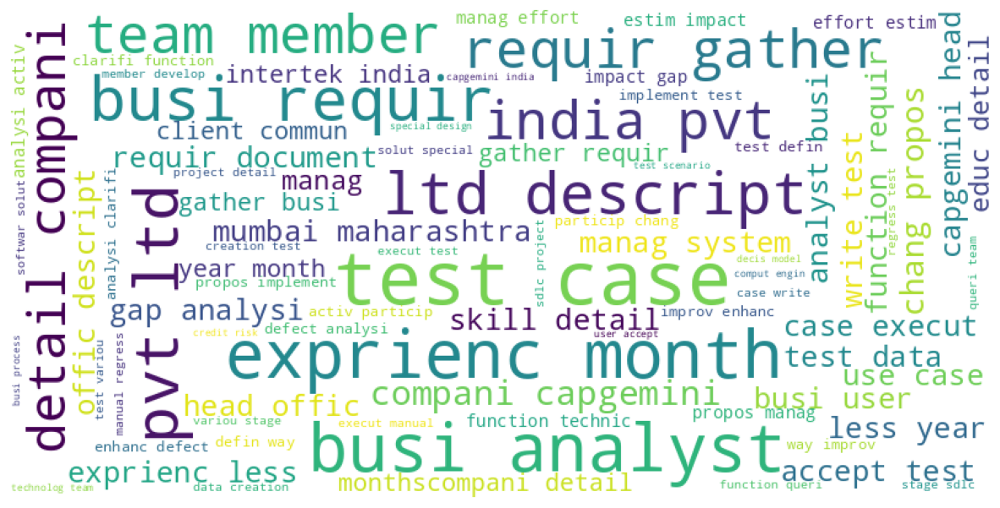

...

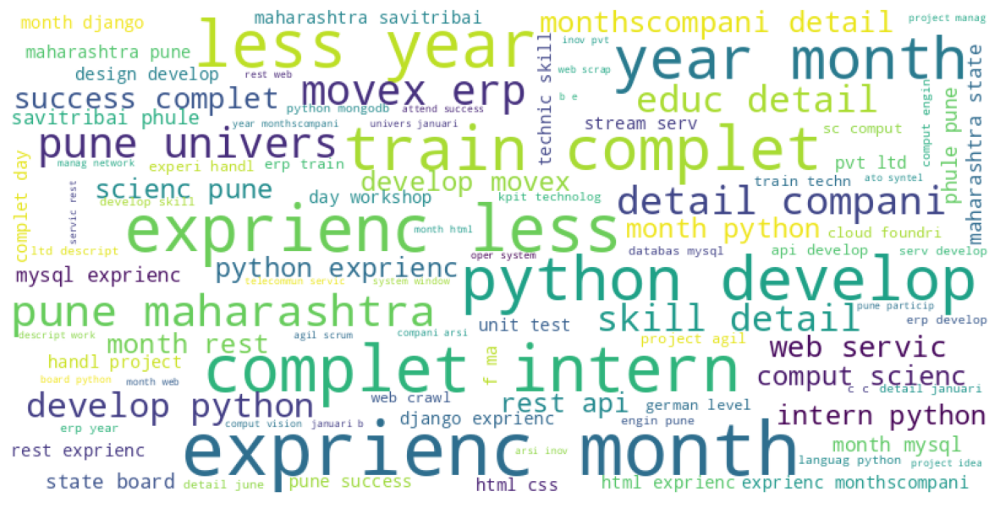

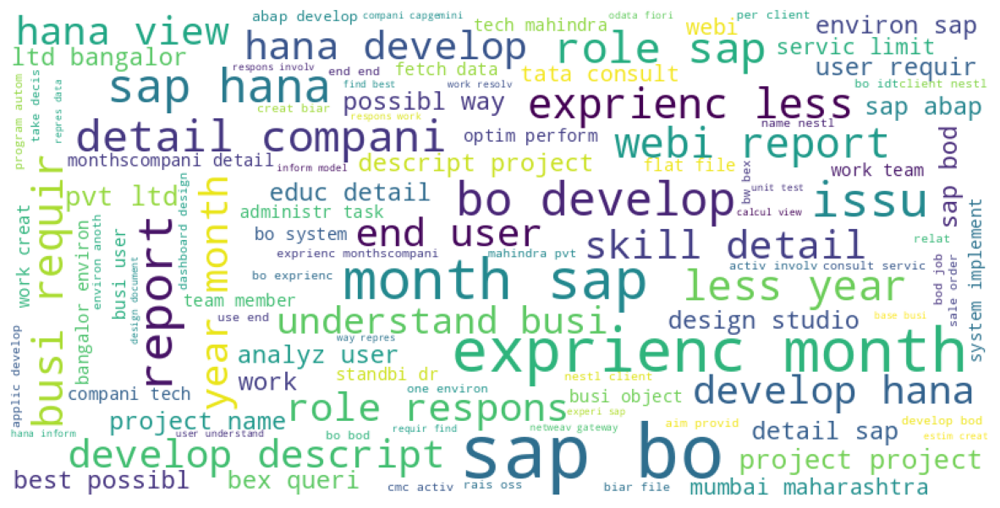

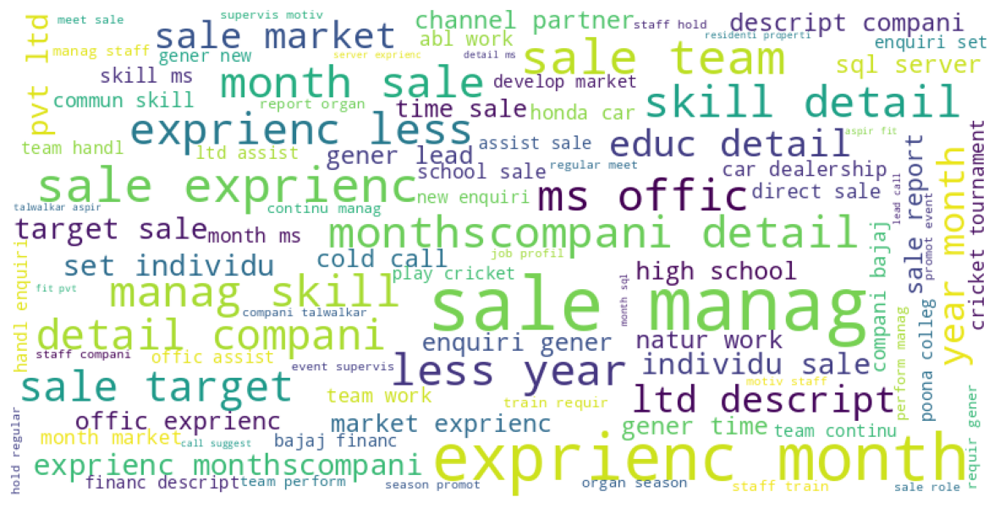

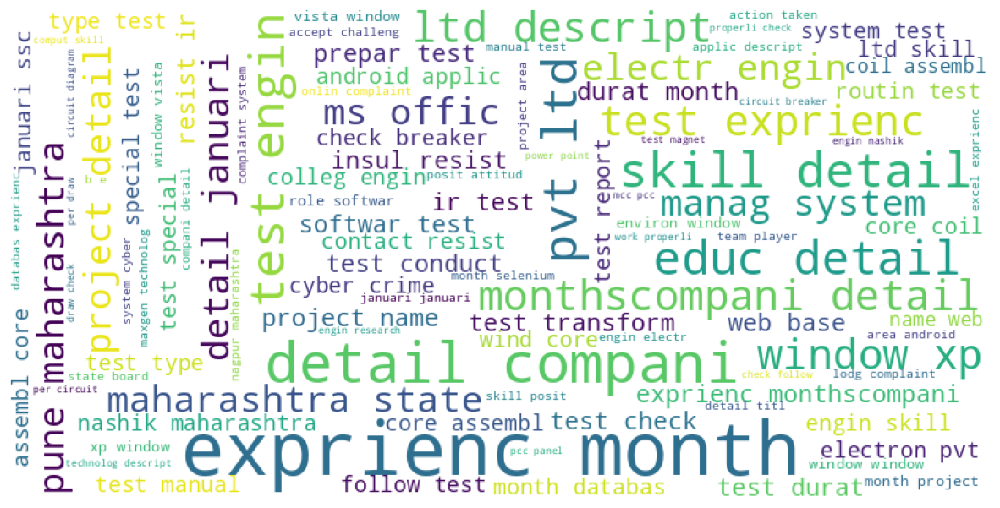

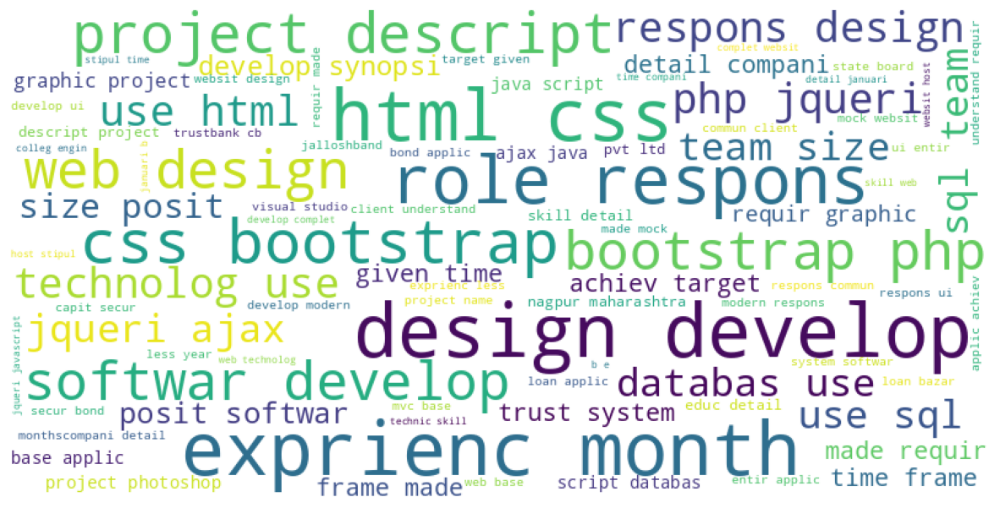

In [18]:
for i in range(25):
    wordcloud_fun(wordcloud_data[i])

In [19]:
data.head

<bound method NDFrame.head of          Category                                             Resume  \
0    Data Science  Skills * Programming Languages: Python (pandas...   
1    Data Science  Education Details \r\nMay 2013 to May 2017 B.E...   
2    Data Science  Areas of Interest Deep Learning, Control Syste...   
3    Data Science  Skills â¢ R â¢ Python â¢ SAP HANA â¢ Table...   
4    Data Science  Education Details \r\n MCA   YMCAUST,  Faridab...   
..            ...                                                ...   
957       Testing  Computer Skills: â¢ Proficient in MS office (...   
958       Testing  â Willingness to accept the challenges. â ...   
959       Testing  PERSONAL SKILLS â¢ Quick learner, â¢ Eagerne...   
960       Testing  COMPUTER SKILLS & SOFTWARE KNOWLEDGE MS-Power ...   
961       Testing  Skill Set OS Windows XP/7/8/8.1/10 Database MY...   

     Category_encode                                      encode_resume  
0                  6  skill pro

In [20]:
cv=CountVectorizer()

In [21]:
train_data_vectorize=cv.fit_transform(data["encode_resume"])
y_train=data["Category_encode"].values

In [22]:
predictor=MultinomialNB()


In [23]:
predictor.fit(train_data_vectorize,y_train)

MultinomialNB()

In [24]:
predictor.score(train_data_vectorize,y_train)

1.0

In [25]:


myresume = """I am a data scientist specializing in machine
learning, deep learning, and computer vision. With
a strong background in mathematics, statistics,
and programming, I am passionate about
uncovering hidden patterns and insights in data.
I have extensive experience in developing
predictive models, implementing deep learning
algorithms, and designing computer vision
systems. My technical skills include proficiency in
Python, Sklearn, TensorFlow, and PyTorch.
What sets me apart is my ability to effectively
communicate complex concepts to diverse
audiences. I excel in translating technical insights
into actionable recommendations that drive
informed decision-making.
If you're looking for a dedicated and versatile data
scientist to collaborate on impactful projects, I am
eager to contribute my expertise. Let's harness the
power of data together to unlock new possibilities
and shape a better future.
Contact & Sources
Email: 611noorsaeed@gmail.com
Phone: 03442826192
Github: https://github.com/611noorsaeed
Linkdin: https://www.linkedin.com/in/noor-saeed654a23263/
Blogs: https://medium.com/@611noorsaeed
Youtube: Artificial Intelligence
ABOUT ME
WORK EXPERIENCE
SKILLES
NOOR SAEED
LANGUAGES
English
Urdu
Hindi
I am a versatile data scientist with expertise in a wide
range of projects, including machine learning,
recommendation systems, deep learning, and computer
vision. Throughout my career, I have successfully
developed and deployed various machine learning models
to solve complex problems and drive data-driven
decision-making
Machine Learnine
Deep Learning
Computer Vision
Recommendation Systems
Data Visualization
Programming Languages (Python, SQL)
Data Preprocessing and Feature Engineering
Model Evaluation and Deployment
Statistical Analysis
Communication and Collaboration"""

In [26]:
def make_answer_1(df):
     review=re.sub('[^a-zA-Z]',' ',df)
     review=review.lower()
     review=review.split()
     review=[ps.stem(word)for word in review if not word in set(all_stopwords)]
     review=' '.join(review)
     review=cv.transform([review])
     a=predictor.predict(review)
     a = a.tolist()  
     p=category_mapping[a[0]]
     return p

In [27]:
answer=make_answer_1(myresume)
answer

'Data Science'